# **Portuguese Bank Marketing** 🏦 🤖

---

## 📝 Introduction

#### 📊 Dataset Overview


This dataset contains information about **direct marketing campaigns** (phone calls) conducted by a Portuguese banking institution. The goal of the campaign was to promote **term deposit subscriptions** — a financial product that boosts bank revenue.

#### 📌 Brief description of the problem

You're hired as a data scientist at a Portuguese bank that's losing revenue because clients aren't depositing money as often as before.

**Your mission? 🕵️‍♀️**  
Build the **most accurate model** to **predict which clients will subscribe** to a term deposit — and help the bank target the right people in its next campaign.

#### 🎯The goal of the project


The target variable is `y`, which indicates whether the client **subscribed to a term deposit**:
- `yes`: client subscribed
- `no`: client did not subscribe

#### 📁 Dataset Shape

- **Rows**: 32,950  
- **Columns**: 16

#### 🔍 Feature Description

| Column        | Description |
|---------------|-------------|
| `age`         | Age of the client (numeric) |
| `job`         | Type of job (admin, technician, retired, etc.) |
| `marital`     | Marital status (married, single, divorced) |
| `education`   | Education level (basic, high school, university) |
| `default`     | Has credit in default? (yes, no, unknown) |
| `housing`     | Has a housing loan? (yes or no) |
| `loan`        | Has a personal loan? (yes or no) |
| `contact`     | Communication type (cellular or telephone) |
| `month`       | Last contact month (e.g., may, jun) |
| `day_of_week` | Last contact day of the week (e.g., mon, tue) |
| `duration`    | Duration of the last contact in seconds — ⚠️ *should not be used in training* (leaks info) |
| `campaign`    | Number of contacts performed during this campaign |
| `pdays`       | Days since the client was last contacted (-1 means never contacted before) |
| `previous`    | Number of contacts before this campaign |
| `poutcome`    | Outcome of the previous marketing campaign |
| `y`           | **Target**: Has the client subscribed to a term deposit? (yes/no) |

 ---

## 📚 Import Libraries

#### 🐍 Essential Python Libraries

In [3]:
import warnings
warnings.filterwarnings('ignore')

#### 📊 Data Analysis Libraries

In [4]:
import numpy as np
import pandas as pd

#### 📉 Visualization Libraries

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

#### 🤖 Machine Learning Libraries

✂️ Data Split Libraries

In [6]:
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, cross_val_score, GridSearchCV, RandomizedSearchCV

Column Transformer

In [7]:
from sklearn.compose import ColumnTransformer

Curse of dimensionality

PCA

In [8]:
from sklearn.decomposition import PCA

Chi-Square

In [9]:
from sklearn.feature_selection import SelectKBest, chi2

📏 Preprocessing libraries

In [10]:
# Libraries for Encoding
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from category_encoders import BinaryEncoder
# Libraries for Feature Scaling
from sklearn.preprocessing import StandardScaler, RobustScaler, Normalizer

⚖️ Handling imbalanced data libraries

In [11]:
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from imblearn.combine import SMOTETomek


🪈 Pipeline libraries

In [12]:
from imblearn.pipeline import Pipeline as ImbPipeline  # Important so we can add SMOTE to the pipeline
from sklearn.pipeline import Pipeline

🤖 Machine Learning Libraries - Models

In [13]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

📏 Evaluation Metrics

In [14]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, classification_report, roc_curve, auc

---

## 📂 Import Dataset

In [15]:
df = pd.read_csv(r"E:/Omar/Courses/ML (AMIT)/ML/Project/Bank Marketing.csv")

---

## 🔍 Data Exploration

#### 📊 Data Overview

In [16]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,y
0,49,blue-collar,married,basic.9y,unknown,no,no,cellular,nov,wed,227,4,999,0,nonexistent,no
1,37,entrepreneur,married,university.degree,no,no,no,telephone,nov,wed,202,2,999,1,failure,no
2,78,retired,married,basic.4y,no,no,no,cellular,jul,mon,1148,1,999,0,nonexistent,yes
3,36,admin.,married,university.degree,no,yes,no,telephone,may,mon,120,2,999,0,nonexistent,no
4,59,retired,divorced,university.degree,no,no,no,cellular,jun,tue,368,2,999,0,nonexistent,no


#### 🏷️ Types of variables

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32950 entries, 0 to 32949
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   age          32950 non-null  int64 
 1   job          32950 non-null  object
 2   marital      32950 non-null  object
 3   education    32950 non-null  object
 4   default      32950 non-null  object
 5   housing      32950 non-null  object
 6   loan         32950 non-null  object
 7   contact      32950 non-null  object
 8   month        32950 non-null  object
 9   day_of_week  32950 non-null  object
 10  duration     32950 non-null  int64 
 11  campaign     32950 non-null  int64 
 12  pdays        32950 non-null  int64 
 13  previous     32950 non-null  int64 
 14  poutcome     32950 non-null  object
 15  y            32950 non-null  object
dtypes: int64(5), object(11)
memory usage: 4.0+ MB


In [18]:
# Separate numerical and categorical columns
# Define numeric columns
numerical_features = df.select_dtypes(include=["int64", "float64"]).columns.tolist()
# Define categorical columns
categorical_features = df.select_dtypes(include=["object"]).columns.tolist()

print('🔢 Numerical Features', numerical_features)
print('🔠 Categorical Features', categorical_features)

🔢 Numerical Features ['age', 'duration', 'campaign', 'pdays', 'previous']
🔠 Categorical Features ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']


#### ⚠️ Missing values
**No** missing values

In [19]:
fig_miss = px.imshow(df.isnull())
fig_miss.show()

In [20]:
df.isnull().sum()

age            0
job            0
marital        0
education      0
default        0
housing        0
loan           0
contact        0
month          0
day_of_week    0
duration       0
campaign       0
pdays          0
previous       0
poutcome       0
y              0
dtype: int64

#### 🔁 Duplicate values
There are `8` duplicated rows.

In [21]:
df.duplicated().sum()

np.int64(8)

#### 📉 Outliers

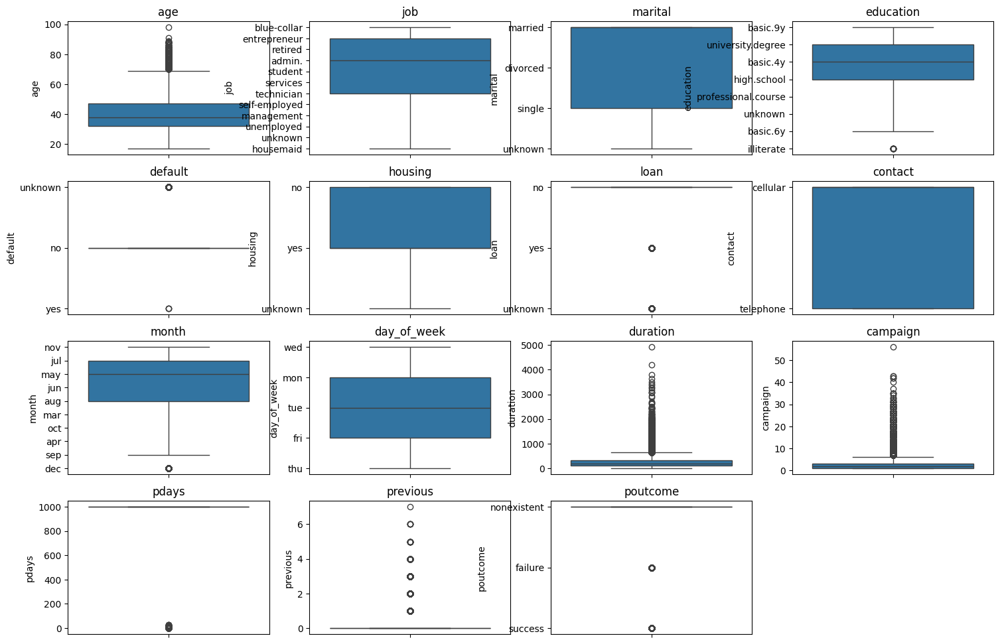

In [22]:
plt.figure(figsize=(18, 12))

for i in range(len(df.columns) - 1):
    plt.subplot(4, 4, i+1)
    sns.boxplot(df.iloc[:, i])
    plt.title(f'{df.columns[i]}')

plt.show()


In [23]:
# Outliers of numerical features
fig_ouliers = px.box(df, y=numerical_features, title='📉 Outliers')
fig_ouliers.update_traces(boxmean=True)  # Adds mean line
fig_ouliers.show()

##### ％ Percentage of outliers for dataset

Function of outliers detection

In [24]:
def outliers_detection(Dataframe, Features):

    for col in Features:
        # Calculate Q1, Q3, and IQR
        Q1 = np.quantile(Dataframe[col], 0.25)
        Q3 = np.quantile(Dataframe[col], 0.75)
        IQR = Q3 - Q1

        # Define outliers boundaries
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identify outliers
        outliers = Dataframe[(Dataframe[col] < lower_bound) | (Dataframe[col] > upper_bound)]

    # Calculate number of outliers
    num_outliers = len(outliers)

    # Calculate percentage of outliers
    percentage_outliers = (len(outliers) / len(Dataframe)) * 100
    print(f"Number of outliers📉: {num_outliers}")
    print(f"Percentage of outliers 📉: {percentage_outliers:.2f}%")

In [25]:
outliers_detection(df, numerical_features)

Number of outliers📉: 4534
Percentage of outliers 📉: 13.76%


> The outliers of the dataset are processed by **`RobustScaler()`** later.

#### 📈 Descriptive statistics

In [26]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32950.0,40.014112,10.403636,17.0,32.0,38.0,47.0,98.0
duration,32950.0,258.127466,258.975917,0.0,103.0,180.0,319.0,4918.0
campaign,32950.0,2.560607,2.752326,1.0,1.0,2.0,3.0,56.0
pdays,32950.0,962.052413,187.951096,0.0,999.0,999.0,999.0,999.0
previous,32950.0,0.174719,0.499025,0.0,0.0,0.0,0.0,7.0


---

## 🧹 Data Cleaning

#### 🛠️ Handling missing values

**No** missing values

#### 🔁 Remove duplicate values

In [27]:
df.drop_duplicates(inplace=True)

Check duplicates after drop

In [28]:
print('Duplicated rows:', df.duplicated().sum())

Duplicated rows: 0


#### 🚫 Dealing with outliers

> The outliers of the dataset are processed by **`RobustScaler()`** later.

#### 🛠️ Processing the `pdays` column
Replace the number `999` with the text `-1` means never contacted before.

In [29]:
# df['was_contacted_before'] = df['pdays'] != 999
df['pdays'] = df['pdays'].apply(lambda x: -1 if x == 999 else int(x))

#### 📝 Rename the target column `y` to `term_deposit`

In [30]:
df.rename(columns={'y' : 'term_deposit'}, inplace=True)

#### ⌚ Convert to Datetime on `month` and `day_of_week`

- `month` Last contact month (e.g., may, jun)
- `day_of_week` Last contact day of the week (e.g., mon, tue)

In [31]:
# df["date"] = pd.to_datetime(df["month"] + " " + df["day_of_week"] + " 2020", format="%b %a %Y")

Extracting timing features

In [32]:
# df['month_num'] = df['date'].dt.month     # Number of month
# df['day_num'] = df['date'].dt.weekday     # 0=Mon, 6=Sun

# df["is_weekend"] = df["day_num"].isin([5, 6]).astype(int)         # Weekend
# df["is_month_start"] = df["date"].dt.is_month_start.astype(int)   # Start of month
# df["is_month_end"] = df["date"].dt.is_month_end.astype(int)       # End of month

In [33]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,term_deposit
0,49,blue-collar,married,basic.9y,unknown,no,no,cellular,nov,wed,227,4,-1,0,nonexistent,no
1,37,entrepreneur,married,university.degree,no,no,no,telephone,nov,wed,202,2,-1,1,failure,no
2,78,retired,married,basic.4y,no,no,no,cellular,jul,mon,1148,1,-1,0,nonexistent,yes
3,36,admin.,married,university.degree,no,yes,no,telephone,may,mon,120,2,-1,0,nonexistent,no
4,59,retired,divorced,university.degree,no,no,no,cellular,jun,tue,368,2,-1,0,nonexistent,no


#### ⏬ Reduce dataset size

In [34]:
for cols in df.columns:
    if df[cols].dtype == 'object':
        df[cols] = df[cols].astype('category')

Reduce memory usage from **4.0+ MB** to **1.9 MB**

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32942 entries, 0 to 32949
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   age           32942 non-null  int64   
 1   job           32942 non-null  category
 2   marital       32942 non-null  category
 3   education     32942 non-null  category
 4   default       32942 non-null  category
 5   housing       32942 non-null  category
 6   loan          32942 non-null  category
 7   contact       32942 non-null  category
 8   month         32942 non-null  category
 9   day_of_week   32942 non-null  category
 10  duration      32942 non-null  int64   
 11  campaign      32942 non-null  int64   
 12  pdays         32942 non-null  int64   
 13  previous      32942 non-null  int64   
 14  poutcome      32942 non-null  category
 15  term_deposit  32942 non-null  category
dtypes: category(11), int64(5)
memory usage: 1.9 MB


#### ❌ Drop `duration` feature

It is not suitable for use in training because it will **leak info** about the result.

In [36]:
# df.drop('duration', axis=1, inplace=True)

#### 🔍 Handling `'unknown'` Values — Strategy & Justification

- marital 65
- housing 796
- loan 796
- education 1396
- job 265
- default 6939
- Total ==> 10257 ==> 31%

##### 1. `housing`, `default` and `loan`

✅ Action: Keep **"Unknown"** as its own category

🎯 Reason: Their large number → The presence of "unknowns" among them may contain important information in and of themselves (the model may learn that the missing information in these features carries a signal).

##### 2. `Marital`
✅ Action: Drop rows where marital == "unknown" (about 65 rows)

🎯 Reason: The number is too small → Removing them will not affect the data size (32K rows), and prevents noise/ambiguity in a sensitive feature like marital status.

In [37]:
# 2) Drop "unknown" in marital
# df = df[df['marital'] != 'unknown'].reset_index(drop=True)
df['marital'] = df['marital'].replace('unknown', np.nan)
df = df.dropna()

In [38]:
df['marital'].value_counts()

marital
married     19947
single       9256
divorced     3674
Name: count, dtype: int64

##### 3. `job` and `education`
✅ Action: Replace "unknown" with the most frequent category (mode) in the same column.

🎯 Reason:

* The number of unknowns among them is moderate-large.

* Removing them would result in a significant loss of data.

* However, considering "unknown" as an independent category would increase noise in the categories. It's better to replace them with a model that reflects the true distribution of the data.

In [39]:
# 3) Impute mode for "education" & "job"
for col in ['job', 'education']:
    # most_freq = df[col].mode()[0]
    df[col] = df[col].replace("unknown", 'others')

---

## 📊 Exploratory Data Analysis (EDA)

In [40]:
df.head(10)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,term_deposit
0,49,blue-collar,married,basic.9y,unknown,no,no,cellular,nov,wed,227,4,-1,0,nonexistent,no
1,37,entrepreneur,married,university.degree,no,no,no,telephone,nov,wed,202,2,-1,1,failure,no
2,78,retired,married,basic.4y,no,no,no,cellular,jul,mon,1148,1,-1,0,nonexistent,yes
3,36,admin.,married,university.degree,no,yes,no,telephone,may,mon,120,2,-1,0,nonexistent,no
4,59,retired,divorced,university.degree,no,no,no,cellular,jun,tue,368,2,-1,0,nonexistent,no
5,29,admin.,single,university.degree,no,no,no,cellular,aug,wed,256,2,-1,0,nonexistent,no
6,26,student,single,basic.9y,no,no,no,telephone,aug,wed,449,1,-1,0,nonexistent,yes
7,30,blue-collar,married,basic.4y,no,yes,no,cellular,nov,wed,126,2,-1,0,nonexistent,no
8,50,blue-collar,married,basic.4y,unknown,no,no,telephone,may,fri,574,1,-1,0,nonexistent,no
9,33,admin.,single,high.school,no,yes,no,cellular,jul,tue,498,5,-1,0,nonexistent,no


#### 📌 What is the **age** distribution in the data?

In [41]:
fig_age = px.histogram(df, x='age', title='Distribution of Age')
fig_age.show()

💡**Insights:**
- Most common age group: The majority of clients are between **30 and 40** years old.

- Distribution shape: The distribution is asymmetrical and **right-skewed**, meaning the number of individuals gradually decreases with age.

- Age spread: Ages range from approximately 20 to 90, but the greatest concentration is between 20 and 60.

- There are high values like age 98 → you may be considered an Outlier or simply an older customer.

#### 📌 What are the most popular **jobs** among customers?

In [42]:
job = df.groupby(['job']).size().rename('counts').sort_values(ascending=False).reset_index()

fig_job = px.bar(job, x='job', y='counts', title='Distribution of jobs title', color='job', text='counts')
fig_job.show()

💡**Insights:**
- **Top three jobs:** *admin*, *blue_collar* and *technician*
- **Less represented jobs:** *student*, *unemployed* and *others*

#### 📌 What is the distribution between married, single, and divorced people?

In [43]:
marital = df.groupby(['marital']).size().rename('counts').reset_index()

fig_marital = px.pie(marital, names='marital', values='counts', title='Distribution of marital of clints')

fig_marital.update_layout(
    width=600,   # Adjust the height
    height=600   # Adjust the witdth
)
fig_marital.show()

💡**Insights:**
- *Most common marital status:* **Married** is the most represented marital status.

#### 📌 What are the most common levels of education?

In [44]:
edu = df.groupby(['education']).size().rename('counts').sort_values(ascending=False).reset_index()

fig_job = px.bar(edu, x='education', y='counts', title='Distribution of education level', color='education', text='counts')
fig_job.show()

💡**Insights:**
- Most common educational level:* **university degree** and **high school** are the most represented.

#### 📌 Is there a large percentage of people who have:
- Default
- Housing loan
- Personal loan

In [45]:

fig = make_subplots(rows=1, cols=3, subplot_titles=('Default Distribution', 'Housing Loan Distribution', 'Personal Loan Distribution'))

# 1. Default Distribution
default_counts = df['default'].value_counts()
fig.add_trace(go.Bar(x=default_counts.index, y=default_counts.values, name='Default', text=default_counts.values), row=1, col=1)

# 2. Housing Loan Distribution
housing_counts = df['housing'].value_counts()
fig.add_trace(go.Bar(x=housing_counts.index, y=housing_counts.values, name='Housing', text=housing_counts.values), row=1, col=2)

# 3. Personal Loan Distribution
loan_counts = df['loan'].value_counts()
fig.add_trace(go.Bar(x=loan_counts.index, y=loan_counts.values, name='Personal Loan', text=loan_counts.values), row=1, col=3)

# Update layout
fig.update_layout(title_text='Distribution of Loan, Housing and Default Status')
fig.show()

💡**Insights:**
- **Default:** The chart shows that the percentage of individuals with defaults is very low. The vast majority of individuals in the dataset have no prior debt defaults.
- **Housing Loan:** The vast majority of people have a home loan (yes), but a large percentage do not (no).
- **Personal Loan:** The vast majority of customers do not have a personal loan.
- **There is a relatively large number of clients who are not identified as to whether they have debts or housing or personal loans.**

#### 📌 What are the most popular months for customer contact?

In [46]:
month = df['month'].value_counts()

fig_month = px.line(month, x=month.index, y=month.values, title='Most popular months for customer contact', markers=True)

fig_month.update_layout(xaxis_title="Months", yaxis_title="Counts")

fig_month.show()

💡**Insights:**

- Most popular month: May is the month with the highest number of customer contacts.
- The bank's marketing campaigns are heavily focused on the spring and summer, with a noticeable decrease in activity during the winter.

#### 📌 What are the most days of the week?

In [47]:
day = df['day_of_week'].value_counts()

fig_day = px.line(month, x=day.index, y=day.values, title='Most days of the week for customer contact', markers=True)

fig_day.update_layout(xaxis_title="Days", yaxis_title="Counts")

fig_day.show()

💡**Insights:**
- Even distribution: Customer calls are distributed roughly evenly across the days of the week.
- No particular day significantly outperforms others, suggesting a consistent communication strategy during workdays.

#### 📌 What are the most commonly used connection type

In [48]:
contact = df.groupby(['contact']).size().rename('counts').reset_index()

fig_contact = px.pie(contact, names='contact', values='counts', title='The most commonly used connection type')

fig_contact.update_layout(
    width=600,   # Adjust the height
    height=600   # Adjust the witdth
)
fig_contact.show()

💡**Insights:**
- **Cellular** seem to be the most favoured method of reaching out of cutomers.

#### 📌 How many calls are there in each campaign? Are there extreme cases?

In [49]:
fig_campaign = make_subplots(rows=1, cols=2, subplot_titles=('Distribution of Calls per Campaign (Histogram)', 'Distribution of Calls per Campaign (Box Plot)'))

# 1. Histogram
# We use go.Histogram which directly takes the dataframe column
fig_campaign.add_trace(go.Histogram(x=df['campaign']), row=1, col=1)

# 2. Box Plot
# We use go.Box which directly takes the dataframe column
fig_campaign.add_trace(go.Box(y=df['campaign']), row=1, col=2)

# Update layout
fig_campaign.update_layout(title_text='How many calls are there in each campaign?')
fig_campaign.show()

💡**Insights:**
- The bank's strategy is to make one or two calls to each customer most of the time.
- The presence of outliers indicates a customer segment that requires more persuasion, but this effort may not always be effective.

#### 📌 Have most of the customers been contacted previously (pdays, previous) or not?

In [50]:
df['previous_contact_status'] = df['pdays'].apply(lambda x: 'Never Contacted' if x == -1 else 'Previously Contacted')

# Create a figure with subplots for a better overview
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Contact Status (from pdays)', 'Previous Contacts Count'))

# Create a count plot for the new 'previous_contact_status' column
contact_status_counts = df['previous_contact_status'].value_counts().reset_index()
contact_status_counts.columns = ['Status', 'Count']

# Add the count plot to the first subplot
fig.add_trace(go.Bar(x=contact_status_counts['Status'], y=contact_status_counts['Count']), row=1, col=1)

# --- Analysis based on 'previous' ---

# Create a histogram for the 'previous' column
# This shows the number of times a client was contacted before this campaign.
previous_counts = df['previous'].value_counts().reset_index()
previous_counts.columns = ['Previous Calls', 'Count']
previous_counts = previous_counts.sort_values(by='Previous Calls')

# Add the histogram to the second subplot
fig.add_trace(go.Bar(x=previous_counts['Previous Calls'], y=previous_counts['Count']), row=1, col=2)


# Update layout for both subplots
fig.update_layout(title_text='Have you contacted customers before?',
                xaxis_title='Communication status',
                yaxis_title='Counts',
                xaxis2_title='Number of previous calls',
                yaxis2_title='Counts')

fig.show()

💡**Insights:**
- We'll notice that the customers have never been contacted before (never contacted), as the value -1 in the pdays column is the most recent.

- In contrast, an analysis of the previous column shows that the number of times the customers were contacted is 0, indicating the same result: the customers in this data are new customers who have not been contacted in previous campaigns. This represents a great opportunity for the bank to promote effective marketing campaigns, as this is a new customer base.

#### 📌 What are the results of previous campaigns (poutcome)?

In [51]:
poutcome = df.groupby(['poutcome']).size().rename('counts').sort_values(ascending=False).reset_index()

fig_poutcome = px.bar(poutcome, x='poutcome', y='counts', title='the results of previous campaigns (poutcome)', color='poutcome', text='counts')
fig_poutcome.show()

💡**Insights:**
- **nonexistent:** A large number of cases in this category indicate that customers were not contacted in previous marketing campaigns, or that the bank's records do not contain data on the results of these communications.

- **failure:** The large number of failures indicates that many previous attempts to persuade clients to subscribe to a term deposit were unsuccessful.

- **success:** This shows that the number of customers who actually signed up for the deposit in previous campaigns is very small compared to the number of failed cases or customers who were not contacted.

#### 📌 Check Is there an imbalance in Target?

In [52]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'term_deposit', 'previous_contact_status'],
      dtype='object')

In [53]:
target = df.groupby(['term_deposit']).size().rename('counts').reset_index()

fig_target = px.pie(target, names='term_deposit', values='counts', title='Distibution of Deposit Subscription')

fig_target.update_layout(
    width=600,   # Adjust the height
    height=600   # Adjust the witdth
)
fig_target.show()

💡**Insights:**
- The plot for the target feature shows **heavy imbalance**

---

#### 🎯 Target-related questions (customer subscribed or not → y)
Here we study the relationship between each features and the target.

##### 📌 Is there a relationship between age and subscription?

In [54]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'term_deposit', 'previous_contact_status'],
      dtype='object')

In [55]:
# Create a figure with a single subplot for the histogram.
fig_age_target = go.Figure()
# --- Histogram: Distribution of Age vs. Subscription Status ---
# This trace shows the ages of clients who subscribed ('yes').
fig_age_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'yes']['age'], name='Subscribe (Yes)', marker_color='green'))
# This trace shows the ages of clients who did not subscribe ('no').
fig_age_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'no']['age'], name='Not subscribed (No)', marker_color='red'))

# Update layout
fig_age_target.update_layout(title_text='The relationship between age and participation in the deposit', xaxis_title='Age', yaxis_title='Counts')

# Show the plot
fig_age_target.show()

💡**Insights:**
- Least Responsive Customers: The age group between 25 and 60 is the most resistant to marketing campaigns, as the rejection rate in this group is very high.

##### 📌 Which jobs have the highest participation rate?

In [56]:
# Create a figure with a single subplot for the histogram.
fig_job_target = go.Figure()
# --- Histogram: Distribution of Age vs. Subscription Status ---
# This trace shows the ages of clients who subscribed ('yes').
fig_job_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'yes']['job'], name='Subscribe (Yes)', marker_color='green'))
# This trace shows the ages of clients who did not subscribe ('no').
fig_job_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'no']['job'], name='Not subscribed (No)', marker_color='red'))

# Update layout
fig_job_target.update_layout(title_text='The relationship between job and participation in the deposit', xaxis_title='Jobs', yaxis_title='Counts')

# Show the plot
fig_job_target.show()

💡**Insights:**
- The largest categories in terms of number, such as **blue-collar**, **admin**, **technician**, and **services**, have low subscription rates.
- The highest subscription rates **(For the number of clients per job)** are shown by **retired**, **student** and **management**, indicating a greater awareness or interest in saving.
- The `job` variable appears to influence the subscription decision and is an important indicator that can be relied upon in campaigns or predictive models.

##### 📌 Does marital status affect the subscription decision?

In [57]:
# Create a figure with a single subplot for the histogram.
fig_marital_target = go.Figure()
# --- Histogram: Distribution of Age vs. Subscription Status ---
# This trace shows the ages of clients who subscribed ('yes').
fig_marital_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'yes']['marital'], name='Subscribe (Yes)', marker_color='green'))
# This trace shows the ages of clients who did not subscribe ('no').
fig_marital_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'no']['marital'], name='Not subscribed (No)', marker_color='red'))

# Update layout
fig_marital_target.update_layout(title_text='The relationship between marital and participation in the deposit', xaxis_title='Jobs', yaxis_title='Counts')

# Show the plot
fig_marital_target.show()

💡**Insights:**
- Married customers are the largest group in campaigns, but their subscription rate (10.1 %) is low relative to their size.
- **Single** customers have a relatively higher subscription rate (14.1 %) than married customers.
- **Divorced** customers are the smallest and least likely to subscribe (10 %).
- This suggests that marital status may influence subscription decisions, especially since singles show relatively better engagement with the product.

##### 📌 Are customers with housing/personal loans less likely to subscribe?

Housing loans

In [58]:
# Create a figure with a single subplot for the histogram.
fig_housing_target = go.Figure()
# --- Histogram: Distribution of Age vs. Subscription Status ---
# This trace shows the ages of clients who subscribed ('yes').
fig_housing_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'yes']['housing'], name='Subscribe (Yes)', marker_color='green'))
# This trace shows the ages of clients who did not subscribe ('no').
fig_housing_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'no']['housing'], name='Not subscribed (No)', marker_color='red'))

# Update layout
fig_housing_target.update_layout(title_text='The relationship between housing loans and participation in the deposit', xaxis_title='housing loans', yaxis_title='Counts')

# Show the plot
fig_housing_target.show()

💡**Insights:**
- Customers with a **housing loan (housing = yes)** are more likely to opt out than those without, suggesting that financial commitments may reduce their desire for a new savings product.
- There are a number of them whose status is being identified.

Personal loans

In [59]:
# Create a figure with a single subplot for the histogram.
fig_personal_target = go.Figure()
# --- Histogram: Distribution of loan vs. Subscription Status ---
# This trace shows the ages of clients who subscribed ('yes').
fig_personal_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'yes']['loan'], name='Subscribe (Yes)', marker_color='green'))
# This trace shows the ages of clients who did not subscribe ('no').
fig_personal_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'no']['loan'], name='Not subscribed (No)', marker_color='red'))

# Update layout
fig_personal_target.update_layout(title_text='The relationship between personal loans and participation in the deposit', xaxis_title='personal loans', yaxis_title='Counts')

# Show the plot
fig_personal_target.show()

💡**Insights:**
- The subscription rate to the deposit is very low whether they have personal loans or not → which means the main factor isn’t clear here, and "loan" doesn’t seem to be the primary influencer.

##### 📌 Which campaign months have the best performance?

In [60]:
# Create a figure with a single subplot for the histogram.
fig_month_target = go.Figure()
# --- Histogram: Distribution of month vs. Subscription Status ---
# This trace shows the ages of clients who subscribed ('yes').
fig_month_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'yes']['month'], name='Subscribe (Yes)', marker_color='green'))
# This trace shows the ages of clients who did not subscribe ('no').
fig_month_target.add_trace(go.Histogram(x=df[df['term_deposit'] == 'no']['month'], name='Not subscribed (No)', marker_color='red'))

# Update layout
fig_month_target.update_layout(title_text='The relationship between month and participation in the deposit', xaxis_title='Months', yaxis_title='Counts')

# Show the plot
fig_month_target.show()

💡**Insights:**

- **May** and **August** show relatively higher subscription rates than other months, making campaign timing during these months more effective.
- In contrast, months such as **March**, **September**, and **December** have weaker subscription rates despite campaigns implemented during them—indicating lower marketing performance during those periods.
- It's worth noting that the timing of a marketing campaign plays a clear role in the likelihood of subscriptions

##### 📌 Is there a relationship between the date of default and the subscription to the term deposit?

In [61]:
df_default = df.groupby(['default', 'term_deposit']).size().unstack().fillna(0)

fig = go.Figure(data=[
    go.Bar(name='Subscribed (Yes)', x=df_default.index, y=df_default['yes'], marker_color='green'),
    go.Bar(name='Not Subscribed (No)', x=df_default.index, y=df_default['no'], marker_color='red')
])

fig.update_layout(
    barmode='group',
    title='Relationship between Default History and Term Deposit Subscription',
    xaxis_title='Has Credit in Default?',
    yaxis_title='Number of Clients'
)

fig.show()

💡**Insights:**
- Customers who have not defaulted on a previous loan (`default=no`) are the vast majority of subscribers.
- Three of them are subscribed in the deposit, which may indicate that this category is less likely to participate or be excluded from campaigns.
- There are a number of them whose status is being identified.

##### 📌 What is the impact of the number of campaigns or previous contacts on subscription?

In [62]:
fig = px.strip(
    df,
    x='campaign',
    y='previous',
    color='term_deposit',
    stripmode='overlay',
    title='Campaign vs Previous (Strip Plot Colored by Subscription)',
    labels={
        'campaign': 'Number of Calls (Current Campaign)',
        'previous': 'Previous Contacts',
        'term_deposit': 'Subscription'
    }
)
fig.show()

💡**Insights:**

- Using `campaign` (number of contacts in the current campaign), it appears that customers who have been contacted less often are more likely to subscribe, while declines increase as the number of contacts increases, suggesting that excessive pushiness may be ineffective.
- Using `previous` (number of contacts in previous campaigns), we note that most subscribers had only 0 or 1 previous attempt, while subscriptions become rarer as this number increases.
- Generally, the fewer previous or current contacts, the more likely they are to subscribe, demonstrating the importance of timing and effectiveness from the first attempt, rather than frequency.

#### 📈 Pair plot


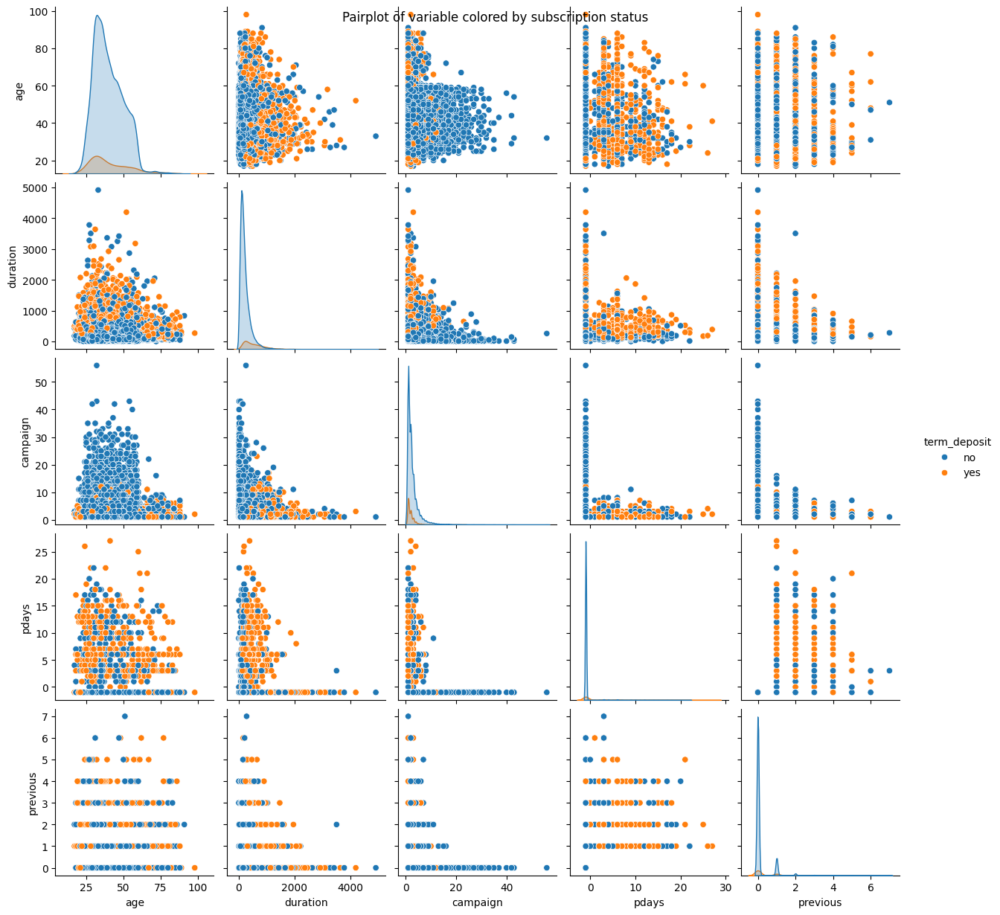

In [63]:
fig_pairplot = sns.pairplot(df, hue='term_deposit')
fig_pairplot.fig.suptitle('Pairplot of variable colored by subscription status')
plt.show()

💡**Insights:**
* Appears that the variable do not exhibit a linear correlation
* The data dispersion across all variables

---

## ⛓ Correlation Analysis

In [64]:
corr = df[numerical_features].corr()

In [70]:
fig_corr = px.imshow(corr, text_auto=True, width=500, height=500, aspect="auto", title='⛓ Correlation Heatmap')

fig_corr.update_traces(
    texttemplate="%{z:.2f}", # Formats the value to 3 decimal places
    textfont=dict(size=10)
)

fig_corr.show()